In [1]:
import pandas as pd
import numpy as np
import h5py
import datetime
import matplotlib.pyplot as plt
from scipy import interpolate
file_name = "more2/connect_two_spectrometers.h5"
h5_file = h5py.File(file_name, "r")

In [2]:
def create_list_of_datasets_in_h5file(h5_file):
    """
    Returns a list of the paths of all datasets in an h5 file.
    Can also be used to list all datasets under a given node (e.g., f['session001']).  In this case,
    the 'session001' is not included in the output paths.
    This comes from:
    https://stackoverflow.com/questions/44883175/how-to-list-all-datasets-in-h5py-file
    :param f:
    :return:
    """
    keys = []
    h5_file.visit(lambda key: keys.append(key) if type(h5_file[key]) is h5py._hl.dataset.Dataset else None)
    return keys


def create_list_of_groups_in_node(node):
    keys = []
    node.visit(lambda key: keys.append(key) if type(node[key]) is h5py._hl.group.Group else None)
    return keys

def create_list_of_items_in_node(item_type, h5_file, node):
    keys = []
    if item_type == "group":
        my_type = h5py._hl.group.Group
    if item_type == "dataset":
        my_type = h5py._hl.dataset.Dataset
    h5_file[node].visit(lambda key: keys.append(key) if type(h5_file[node][key]) is my_type else None)
    return keys

def create_list_of_insertions_in_node(h5_file, node):
    insertions = []
    all_groups = create_list_of_items_in_node("group", h5_file, node)
    for group in all_groups:
        if group[-6:-3] == 'ins':
            insertions.append(group)
    return insertions

def create_session_insertion_dict(h5_file):
    keys = list(h5_file.keys())
    key_dict = {}
    for key in keys:
        # session_number = int(key[-3:])
        key_dict[key] = create_list_of_insertions_in_node(h5_file, key)
    print(key_dict)
    return key_dict

def create_list_of_calibrations_in_node(h5_file, node):
    calibrations = []
    all_groups = create_list_of_items_in_node("group", h5_file, node)
    for group in all_groups:
        if group[-6:-3] == 'cal':
            calibrations.append(group)
    return calibrations


def create_session_calibration_dict(h5_file):
    keys = list(h5_file.keys())
    key_dict = {}
    for key in keys:
        key_dict[key] = create_list_of_calibrations_in_node(h5_file, key)
    print(key_dict)
    return key_dict

def get_wavelengths_vector(h5_file, session, insertion, spectrometer):
    if spectrometer == "spectrometer1":
        vector_attr = "spec1_wavelengths_vector"
    elif spectrometer == "spectrometer2":
        vector_attr = "spec2_wavelengths_vector"
    else:
        print("spectrometer not specified")
        vector_attr = ""

    insertion_group = h5_file[f"{session}/{insertion}"]
    wavelengths_vector = insertion_group.parent.attrs[vector_attr][:]
    return wavelengths_vector

def get_absorbance_spectra_in_insertion(h5_file, session, insertion):
    absorbance_string = "spectrometer1/derived/absorbances"
    absorbance_spectra = h5_file[f"{session}/{insertion}/{absorbance_string}"][:]
    print(absorbance_spectra)
    return absorbance_spectra

def get_absorbance_spectra_and_depth_in_insertion(h5_file, session, insertion):
    dset_string = "derived/absorbance_depth"
    dset = h5_file[f"{session}/{insertion}/{dset_string}"]
    absorbance_spectra = dset[:, :-2]
    depths = dset[:, -1]
    forces = dset[:, -2]
    print(absorbance_spectra)
    return absorbance_spectra, depths, forces

def get_current_time():
    return np.datetime64(datetime.datetime.now()).astype(np.int64)


def timestamp_list_to_pandas_timestamps(timestamp_list):
    series = pd.Series(timestamp_list).astype('<M8[us]')
    return series

def find_zoomed_yvalues(wavelengths_vector, absorbance_spectrum):
    
    # get min_val, max_val of 1700 to 1800 nm
    mid_waves = (wavelengths_vector > 1700) & (wavelengths_vector < 1800)
    minval = absorbance_spectrum[mid_waves].min()
    maxval = absorbance_spectrum[mid_waves].max()
    ymin = minval - (minval * 0.005)
    ymax = maxval + (maxval * 0.005)
    return ymin, ymax

# Session 003
The third session was collected to see if insertion speed will change the number of "unusual" spectra collected with the NIRONE.  The insertions are all located within a few inches of each other in the Barrett front yard.  Insertions 1 & 2 were done at the previously-used 10 mm/second; Insertions 3 & 4 were done at 3 mm/second;  Insertions 5 & 6 were done at 15 mm/second.

In [3]:
inserts = create_list_of_insertions_in_node(h5_file, "session003")
inserts

['cal001/ins001',
 'cal001/ins002',
 'cal001/ins003',
 'cal001/ins004',
 'cal001/ins005',
 'cal001/ins006']

In [4]:
waves = h5_file['session003/cal001'].attrs['spec1_wavelengths_vector'][:]
waves

array([1550., 1551., 1552., 1553., 1554., 1555., 1556., 1557., 1558.,
       1559., 1560., 1561., 1562., 1563., 1564., 1565., 1566., 1567.,
       1568., 1569., 1570., 1571., 1572., 1573., 1574., 1575., 1576.,
       1577., 1578., 1579., 1580., 1581., 1582., 1583., 1584., 1585.,
       1586., 1587., 1588., 1589., 1590., 1591., 1592., 1593., 1594.,
       1595., 1596., 1597., 1598., 1599., 1600., 1601., 1602., 1603.,
       1604., 1605., 1606., 1607., 1608., 1609., 1610., 1611., 1612.,
       1613., 1614., 1615., 1616., 1617., 1618., 1619., 1620., 1621.,
       1622., 1623., 1624., 1625., 1626., 1627., 1628., 1629., 1630.,
       1631., 1632., 1633., 1634., 1635., 1636., 1637., 1638., 1639.,
       1640., 1641., 1642., 1643., 1644., 1645., 1646., 1647., 1648.,
       1649., 1650., 1651., 1652., 1653., 1654., 1655., 1656., 1657.,
       1658., 1659., 1660., 1661., 1662., 1663., 1664., 1665., 1666.,
       1667., 1668., 1669., 1670., 1671., 1672., 1673., 1674., 1675.,
       1676., 1677.,

In [5]:
cols = waves.tolist()
cols.append('force')
cols.append('depth')


In [6]:
dfs = []
for i in range(len(inserts)):
    df_name = f"df{i+1}"
    dfs.append(df_name)
absorb_str = 'derived/absorbance_depth'
for i in range(len(inserts)):
    dfs[i] = pd.DataFrame(data = h5_file[f'session003/{inserts[i]}/{absorb_str}'][:], columns=cols)

## Plot absorbance spectra by insertion (Session 003)

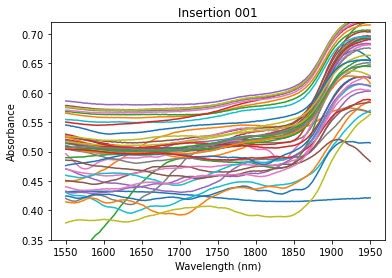

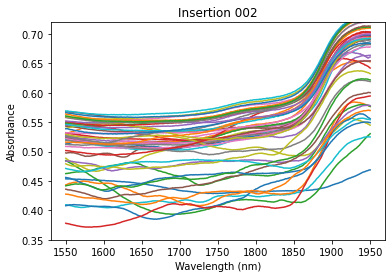

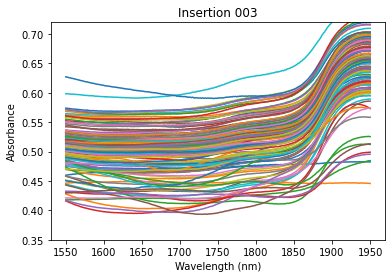

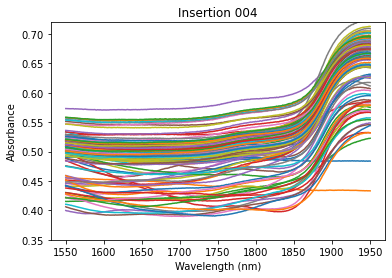

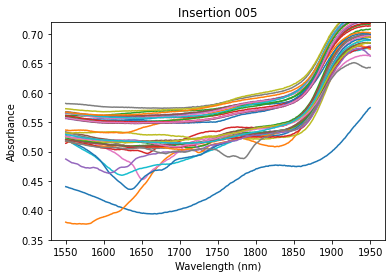

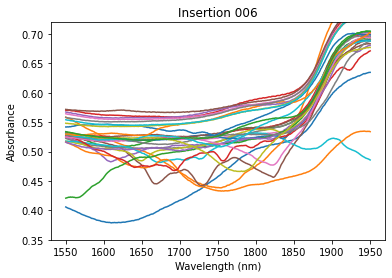

In [7]:
for i in range(len(dfs)):
    fig, ax = plt.subplots()
    ax.set_ylim(0.35, 0.72)
    ax.set_ylabel("Absorbance")
    ax.set_xlabel("Wavelength (nm)")
    ax.set_title(f"Insertion {(i + 1):03d}")
    for spectrum in range(dfs[i].shape[0]):
        ax.plot(waves, dfs[i].iloc[spectrum, :-2])
    plt.show()

## Plot force by depth for each insertion (Session 003)

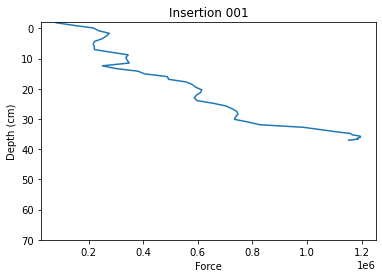

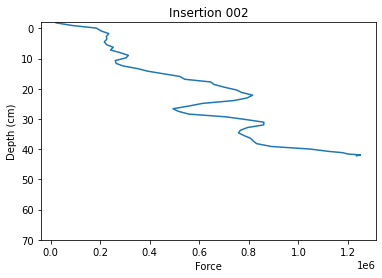

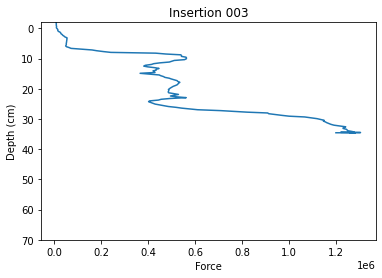

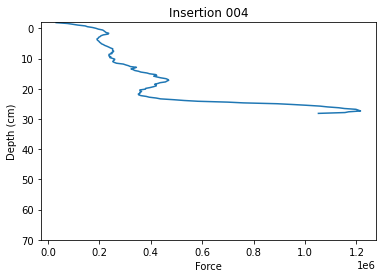

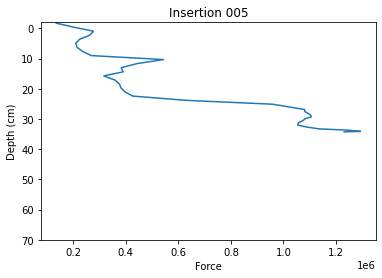

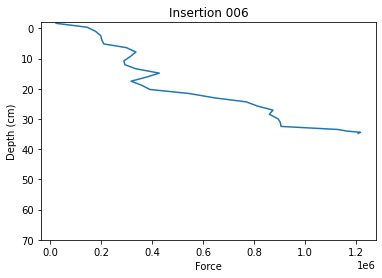

In [8]:
for i in range(len(dfs)):
    fig, ax = plt.subplots()
    ax.set_ylim(70.0, -2.0)
    ax.set_ylabel("Depth (cm)")
    ax.set_xlabel("Force")
    ax.set_title(f"Insertion {(i + 1):03d}")
    
    force = dfs[i].loc[:, "force"]
    
    depth = dfs[i].loc[:, "depth"]
    ax.plot(force, depth)

## Plot absorbance by depth at four different wavelengths (Session 003)

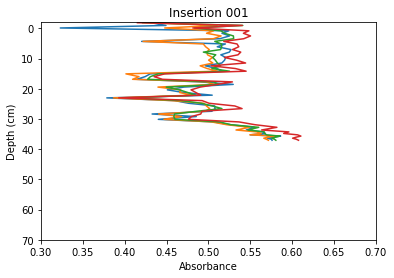

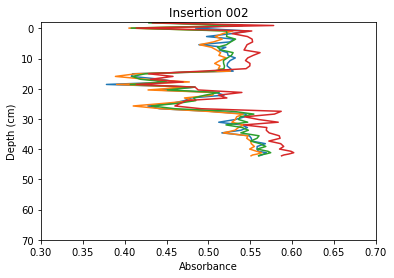

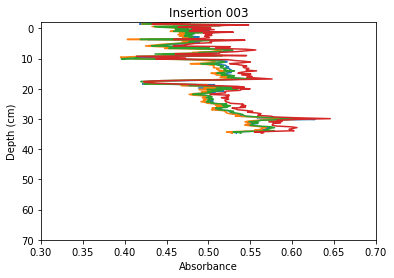

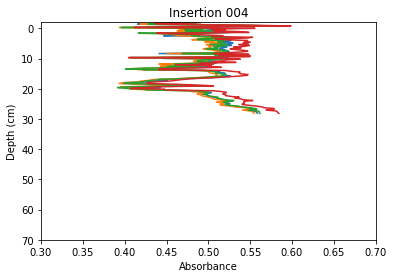

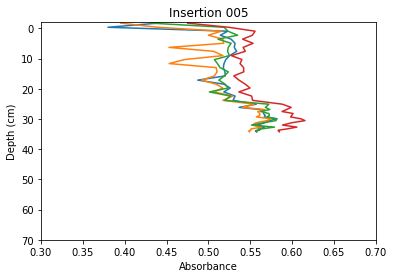

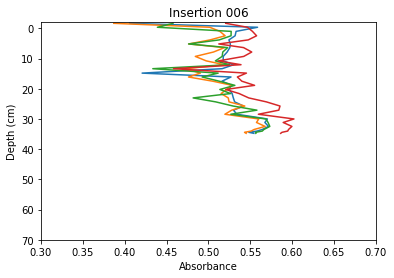

In [9]:
for i in range(len(dfs)):
    fig, ax = plt.subplots()
    ax.set_ylim(70.0, -2.0)
    ax.set_xlim(0.3, 0.7)
    ax.set_ylabel("Depth (cm)")
    ax.set_xlabel("Absorbance")
    ax.set_title(f"Insertion {(i + 1):03d}")
    abs1550 = dfs[i].loc[:, 1550.0]
    abs1650 = dfs[i].loc[:, 1650.0]
    abs1750 = dfs[i].loc[:, 1750.0]
    abs1850 = dfs[i].loc[:, 1850.0]
    depth = dfs[i].loc[:, "depth"]
    ax.plot(abs1550, depth)
    ax.plot(abs1650, depth)
    ax.plot(abs1750, depth)
    ax.plot(abs1850, depth)

## Plot Force by Absorbance at 1750 nm (Session 003)

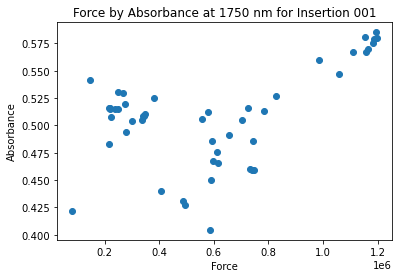

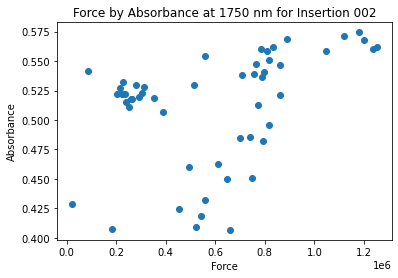

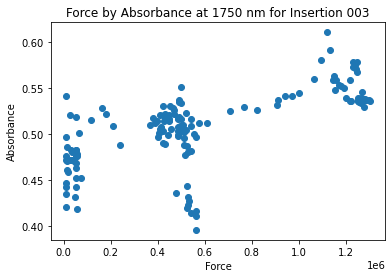

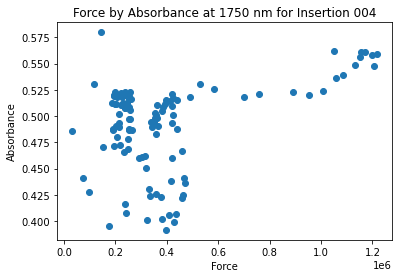

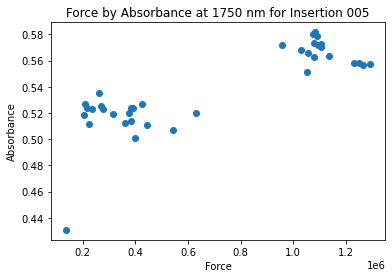

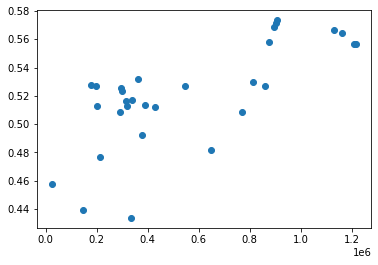

In [10]:
for i in range(len(dfs)):
    ax.set_title(f"Force by Absorbance at 1750 nm for Insertion {i:03d}")
    ax.set_ylabel("Absorbance")
    ax.set_xlabel("Force")
    force = dfs[i].loc[:, 'force']
    abs1750 = dfs[i].loc[:, 1750.0]
    fig, ax = plt.subplots()
    ax.plot(force, abs1750, 'o')

## Plot Force by Absorbance at 1600 nm (Session 003)

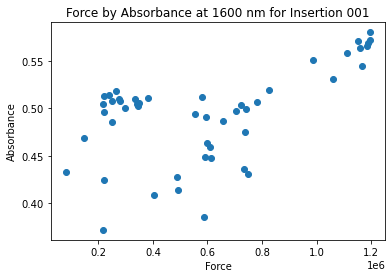

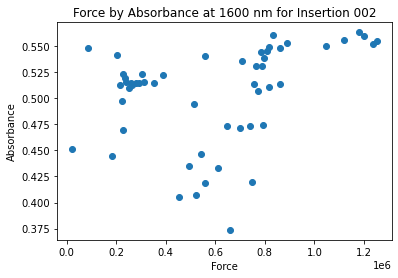

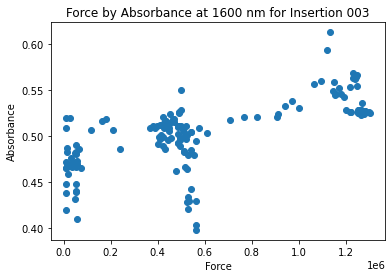

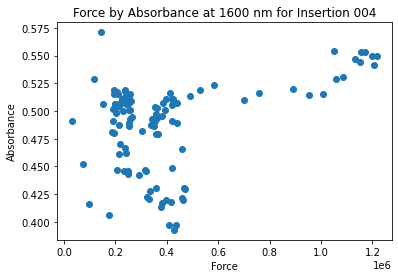

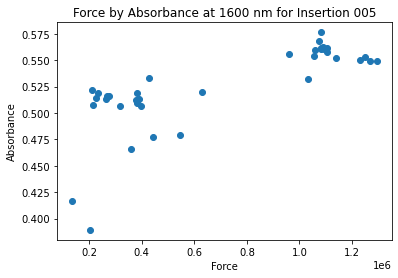

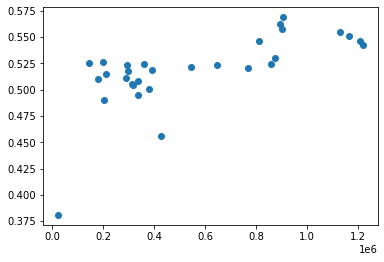

In [11]:
for i in range(len(dfs)):
    ax.set_title(f"Force by Absorbance at 1600 nm for Insertion {i:03d}")
    ax.set_ylabel("Absorbance")
    ax.set_xlabel("Force")
    force = dfs[i].loc[:, 'force']
    abs1750 = dfs[i].loc[:, 1600.0]
    fig, ax = plt.subplots()
    ax.plot(force, abs1750, 'o')

## Plot individual absorbance spectra (Session 003)

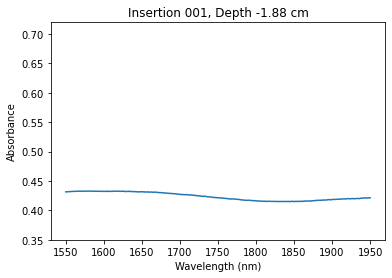

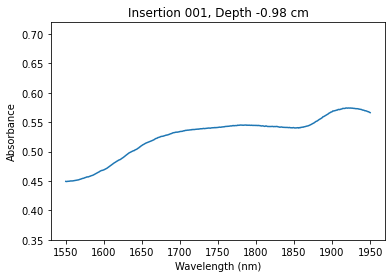

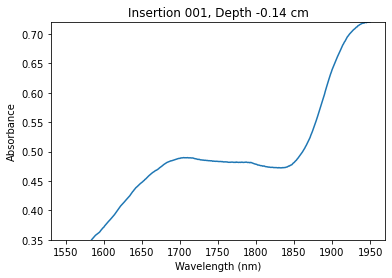

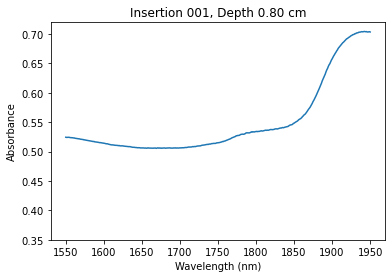

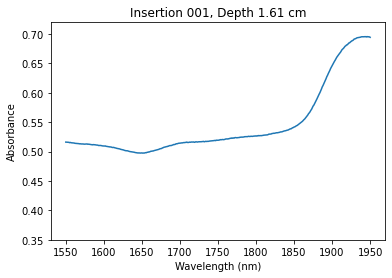

...

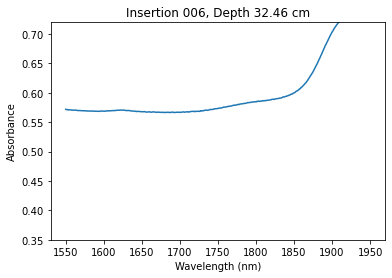

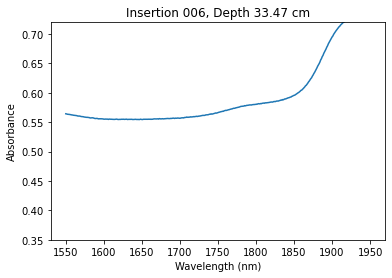

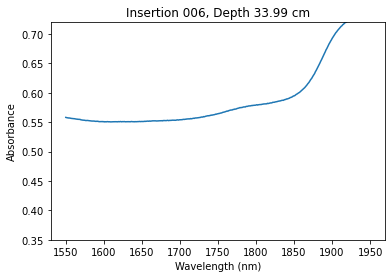

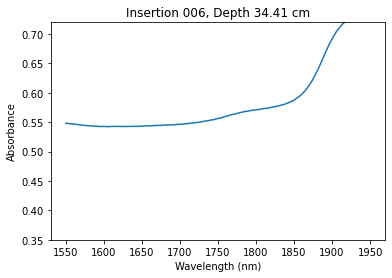

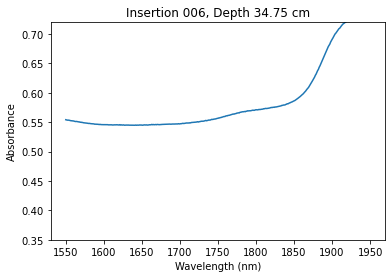

In [12]:
for i in range(len(dfs)):  
    for spectrum in range(dfs[i].shape[0]):
        fig, ax = plt.subplots()
        ax.set_ylim(0.35, 0.72)
        ax.set_ylabel("Absorbance")
        ax.set_xlabel("Wavelength (nm)")
        ax.set_title(f"Insertion {(i + 1):03d}, Depth {dfs[i].iloc[spectrum, -1]:0.2f} cm")
        ax.plot(waves, dfs[i].iloc[spectrum, :-2])
        plt.show()

## Plot individual absorbance spectra, zoomed to 1700 to 1800 nm (Session 003)

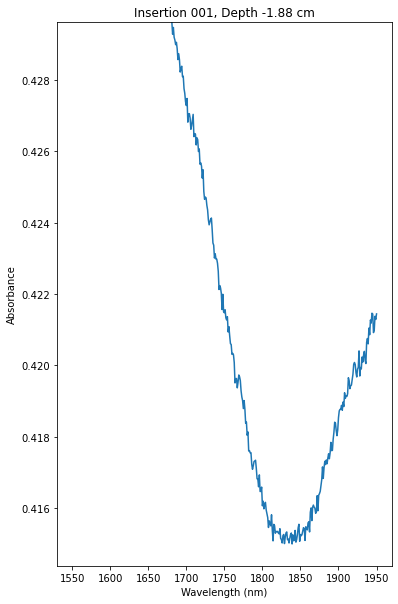

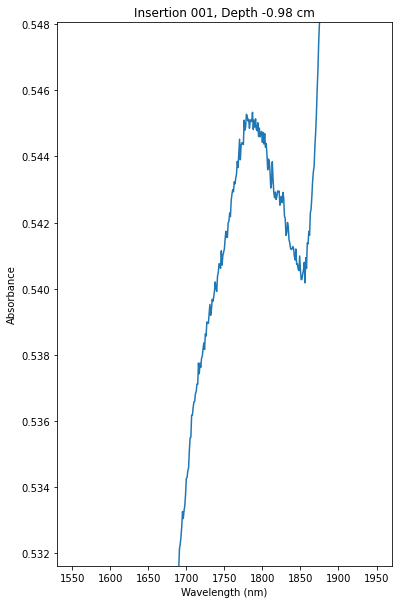

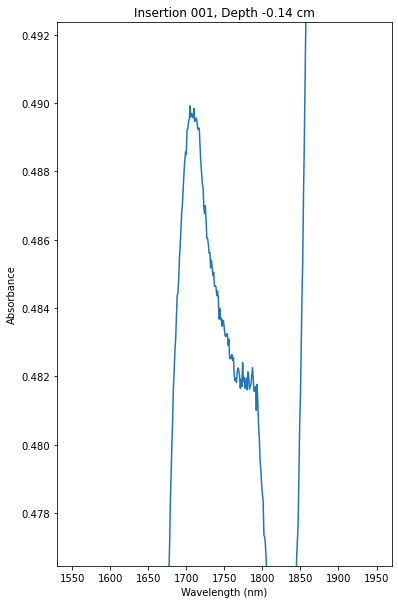

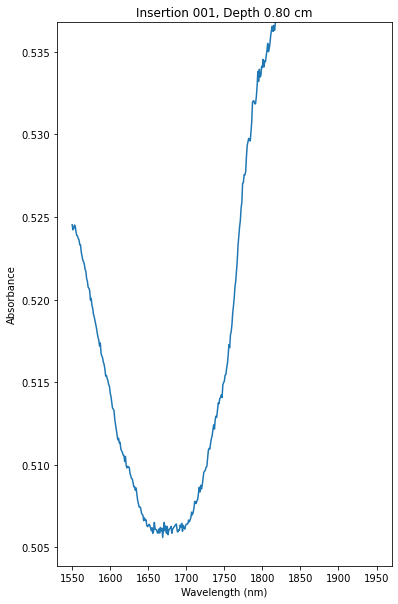

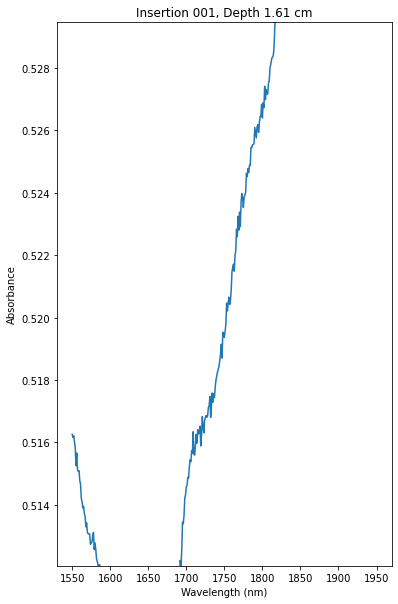

...

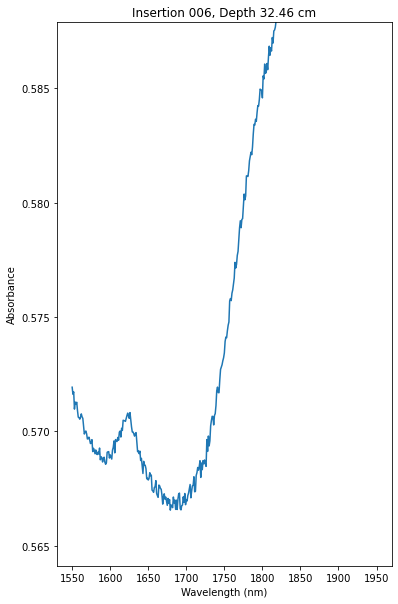

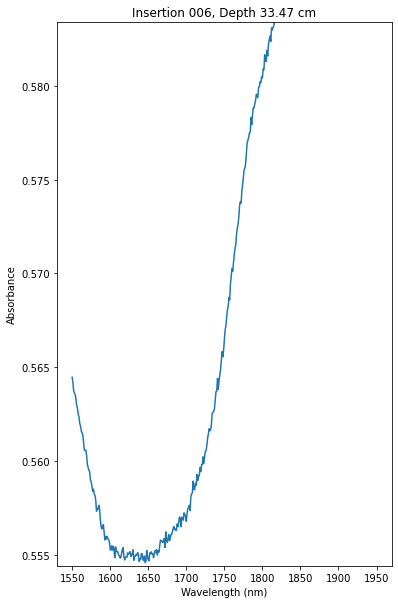

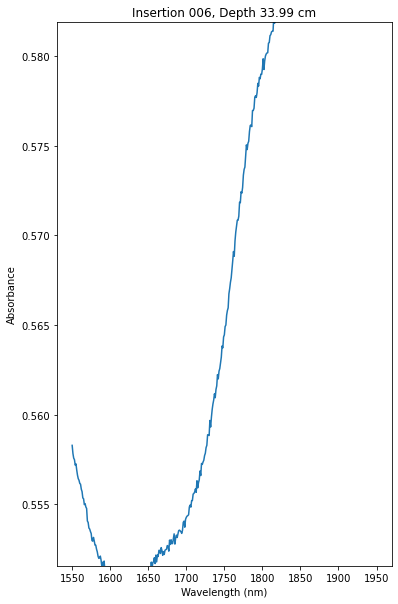

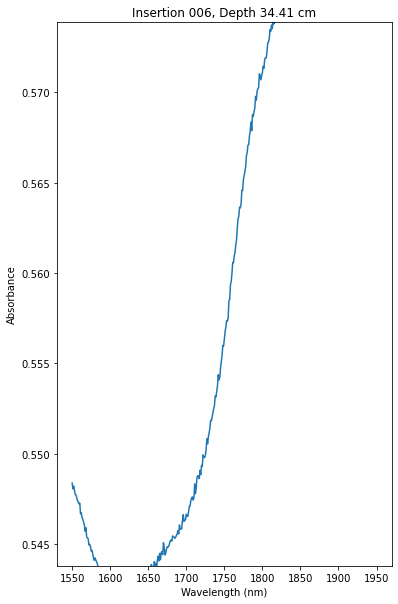

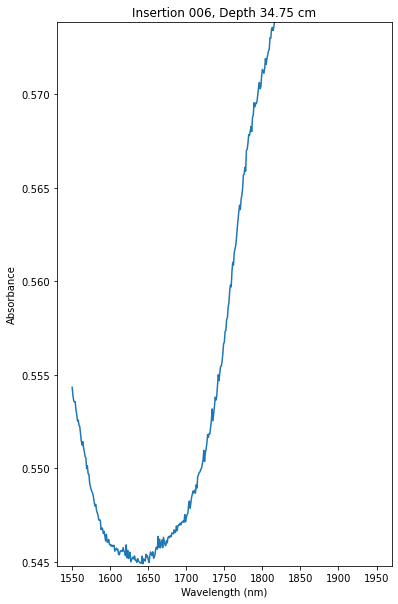

In [13]:
for i in range(len(dfs)):  
    for spectrum in range(dfs[i].shape[0]):
        absorb_spectrum = dfs[i].iloc[spectrum, :-2]
        ymin,ymax = find_zoomed_yvalues(waves, absorb_spectrum)
        fig, ax = plt.subplots(figsize=(6, 10))
        ax.set_ylim(ymin, ymax)
        ax.set_ylabel("Absorbance")
        ax.set_xlabel("Wavelength (nm)")
        ax.set_title(f"Insertion {(i + 1):03d}, Depth {dfs[i].iloc[spectrum, -1]:0.2f} cm")
        ax.plot(waves, absorb_spectrum)
        plt.show()

In [14]:
spectra = dfs[5].iloc[:, :-2]
spectra

,1550.0,1551.0,1552.0,1553.0,1554.0,1555.0,1556.0,1557.0,1558.0,1559.0,...,1941.0,1942.0,1943.0,1944.0,1945.0,1946.0,1947.0,1948.0,1949.0,1950.0
0,0.405865,0.405048,0.404390,0.403741,0.403289,0.403144,0.402384,0.401861,0.401260,0.400316,...,0.632354,0.632880,0.632265,0.633111,0.633271,0.633924,0.634152,0.634727,0.634755,0.634927
1,0.558801,0.557767,0.557070,0.556811,0.556420,0.556125,0.555669,0.554833,0.554417,0.553809,...,0.758999,0.759125,0.758660,0.757968,0.757661,0.755705,0.754406,0.754041,0.750570,0.749524
2,0.533149,0.533006,0.532344,0.531659,0.531093,0.530363,0.529554,0.528855,0.528831,0.528089,...,0.704010,0.704250,0.704245,0.704836,0.705157,0.705274,0.704808,0.705089,0.704143,0.704868
3,0.531959,0.532065,0.531716,0.531527,0.530861,0.531219,0.531411,0.531253,0.531040,0.530649,...,0.698774,0.699224,0.699381,0.699258,0.699544,0.698885,0.698721,0.699859,0.699814,0.699851
4,0.524578,0.523780,0.523842,0.523213,0.522894,0.522384,0.521880,0.521501,0.521130,0.520752,...,0.701776,0.701740,0.702408,0.702002,0.702747,0.702467,0.702163,0.702354,0.702223,0.702500
5,0.526311,0.526040,0.526339,0.526194,0.525929,0.525444,0.524666,0.524143,0.524002,0.523956,...,0.687578,0.687756,0.688366,0.688631,0.689207,0.689414,0.689867,0.690250,0.690560,0.691146
6,0.525654,0.525306,0.525382,0.525092,0.524694,0.524869,0.524822,0.524438,0.524079,0.523765,...,0.693529,0.694105,0.694026,0.694305,0.694647,0.695211,0.694683,0.695324,0.694697,0.695301
7,0.522443,0.521971,0.521652,0.521203,0.520810,0.520385,0.520033,0.519263,0.519063,0.518718,...,0.696138,0.695706,0.696223,0.696156,0.696344,0.695796,0.695840,0.696622,0.696654,0.696424
8,0.517755,0.517429,0.517657,0.517113,0.517169,0.517015,0.516686,0.516406,0.516001,0.516019,...,0.689660,0.689916,0.690154,0.690348,0.690193,0.690759,0.690792,0.691075,0.691265,0.690690
9,0.517770,0.517791,0.517636,0.517434,0.517561,0.517173,0.517215,0.516959,0.517117,0.517308,...,0.491324,0.490822,0.490004,0.489138,0.488786,0.488271,0.487818,0.487335,0.486489,0.485850


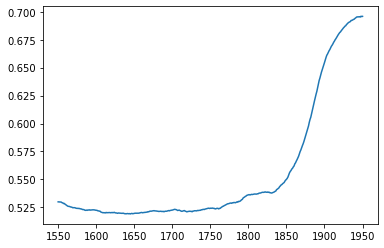

In [15]:
plt.plot(waves, spectra.median())

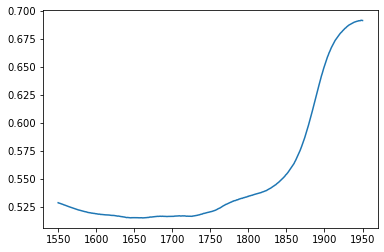

In [16]:
plt.plot(waves, spectra.mean())

In [17]:
dif = spectra - spectra.mean()

In [18]:
dif

,1550.0,1551.0,1552.0,1553.0,1554.0,1555.0,1556.0,1557.0,1558.0,1559.0,...,1941.0,1942.0,1943.0,1944.0,1945.0,1946.0,1947.0,1948.0,1949.0,1950.0
0,-0.122754,-0.123260,-0.123767,-0.124152,-0.124378,-0.124271,-0.124845,-0.125013,-0.125433,-0.126117,...,-0.057861,-0.057601,-0.058329,-0.057598,-0.057717,-0.057126,-0.056872,-0.056716,-0.056525,-0.056273
1,0.030182,0.029459,0.028913,0.028918,0.028753,0.028709,0.028439,0.027958,0.027725,0.027376,...,0.068784,0.068645,0.068066,0.067259,0.066673,0.064655,0.063382,0.062597,0.059290,0.058324
2,0.004529,0.004698,0.004187,0.003766,0.003426,0.002948,0.002324,0.001980,0.002138,0.001655,...,0.013795,0.013769,0.013650,0.014127,0.014170,0.014224,0.013784,0.013646,0.012863,0.013668
3,0.003339,0.003757,0.003559,0.003634,0.003195,0.003804,0.004181,0.004379,0.004347,0.004216,...,0.008558,0.008744,0.008786,0.008549,0.008556,0.007835,0.007697,0.008416,0.008535,0.008651
4,-0.004042,-0.004527,-0.004315,-0.004680,-0.004772,-0.005031,-0.005349,-0.005374,-0.005562,-0.005681,...,0.011560,0.011259,0.011813,0.011293,0.011759,0.011417,0.011139,0.010910,0.010943,0.011299
5,-0.002309,-0.002268,-0.001818,-0.001700,-0.001738,-0.001971,-0.002563,-0.002731,-0.002691,-0.002478,...,-0.002637,-0.002724,-0.002229,-0.002078,-0.001781,-0.001636,-0.001157,-0.001194,-0.000719,-0.000054
6,-0.002966,-0.003002,-0.002775,-0.002801,-0.002973,-0.002546,-0.002408,-0.002437,-0.002613,-0.002668,...,0.003314,0.003624,0.003431,0.003596,0.003659,0.004161,0.003659,0.003881,0.003417,0.004101
7,-0.006177,-0.006337,-0.006505,-0.006691,-0.006857,-0.007030,-0.007197,-0.007612,-0.007630,-0.007715,...,0.005923,0.005226,0.005628,0.005447,0.005356,0.004746,0.004816,0.005179,0.005375,0.005224
8,-0.010865,-0.010879,-0.010500,-0.010780,-0.010498,-0.010400,-0.010543,-0.010469,-0.010692,-0.010415,...,-0.000556,-0.000565,-0.000440,-0.000361,-0.000794,-0.000291,-0.000232,-0.000369,-0.000014,-0.000510
9,-0.010850,-0.010516,-0.010521,-0.010459,-0.010105,-0.010243,-0.010014,-0.009915,-0.009575,-0.009126,...,-0.198891,-0.199658,-0.200591,-0.201571,-0.202201,-0.202779,-0.203206,-0.204108,-0.204790,-0.205351


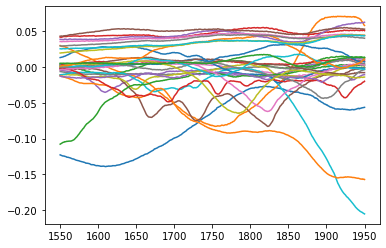

In [19]:
for i in range(dif.shape[0]):
    plt.plot(waves, dif.iloc[i, :])
plt.show()

In [28]:
for i in range(dif.shape[0]):
    print((dif.iloc[i, :].to_numpy().ptp()))

0.11251945630683235
0.15402562963347866
0.025879597446775704
0.008542872730088247
0.04800281625888925
0.0829846847512159
0.01862401091147592
0.02076807423056659
0.034964364843467655
0.20415070839901284
0.03335237599969765
0.14507271320563453
0.11128512237434268
0.047126402487098595
0.014358588900933333
0.024043723635994163
0.07131883894009283
0.05046403127234744
0.0734488676420949
0.03106251748690636
0.02458957669950157
0.045195861083994204
0.017520902736853805
0.013916542490393202
0.02762592580164369
0.012375555484723466
0.011566456646306622
0.01599070423678106
0.025697891493209113
0.019177481074063363


In [29]:
dif_range = dif.max(axis=1) - dif.min(axis=1)

In [30]:
dif_range

0     0.112519
1     0.154026
2     0.025880
3     0.008543
4     0.048003
5     0.082985
6     0.018624
7     0.020768
8     0.034964
9     0.204151
10    0.033352
11    0.145073
12    0.111285
13    0.047126
14    0.014359
15    0.024044
16    0.071319
17    0.050464
18    0.073449
19    0.031063
20    0.024590
21    0.045196
22    0.017521
23    0.013917
24    0.027626
25    0.012376
26    0.011566
27    0.015991
28    0.025698
29    0.019177
dtype: float64

In [33]:
dif['range'] = dif_range

In [35]:
dif.loc[dif['range'] > 0.05]

,1550.0,1551.0,1552.0,1553.0,1554.0,1555.0,1556.0,1557.0,1558.0,1559.0,...,1942.0,1943.0,1944.0,1945.0,1946.0,1947.0,1948.0,1949.0,1950.0,range
0,-0.122754,-0.123260,-0.123767,-0.124152,-0.124378,-0.124271,-0.124845,-0.125013,-0.125433,-0.126117,...,-0.057601,-0.058329,-0.057598,-0.057717,-0.057126,-0.056872,-0.056716,-0.056525,-0.056273,0.112519
1,0.030182,0.029459,0.028913,0.028918,0.028753,0.028709,0.028439,0.027958,0.027725,0.027376,...,0.068645,0.068066,0.067259,0.066673,0.064655,0.063382,0.062597,0.059290,0.058324,0.154026
5,-0.002309,-0.002268,-0.001818,-0.001700,-0.001738,-0.001971,-0.002563,-0.002731,-0.002691,-0.002478,...,-0.002724,-0.002229,-0.002078,-0.001781,-0.001636,-0.001157,-0.001194,-0.000719,-0.000054,0.082985
9,-0.010850,-0.010516,-0.010521,-0.010459,-0.010105,-0.010243,-0.010014,-0.009915,-0.009575,-0.009126,...,-0.199658,-0.200591,-0.201571,-0.202201,-0.202779,-0.203206,-0.204108,-0.204790,-0.205351,0.204151
11,-0.012121,-0.012418,-0.012659,-0.012722,-0.013284,-0.013927,-0.014045,-0.014314,-0.014970,-0.015057,...,-0.155433,-0.155894,-0.156208,-0.156562,-0.156719,-0.156325,-0.157018,-0.156705,-0.157194,0.145073
12,-0.107770,-0.107082,-0.106461,-0.105798,-0.105130,-0.105099,-0.104312,-0.104403,-0.104012,-0.103731,...,0.002532,0.002482,0.002991,0.002733,0.002090,0.002886,0.002406,0.002597,0.002572,0.111285
16,-0.003699,-0.003469,-0.003154,-0.003050,-0.003361,-0.003374,-0.003546,-0.003124,-0.002887,-0.002555,...,0.004090,0.004058,0.003798,0.003165,0.003265,0.003137,0.002807,0.003117,0.002811,0.071319
17,-0.000228,-0.000373,-0.000237,-0.000287,-0.000369,-0.000496,-0.000337,-0.000093,0.000039,-0.000087,...,-0.007208,-0.006554,-0.006044,-0.005370,-0.004678,-0.004464,-0.003985,-0.003971,-0.003472,0.050464
18,0.001210,0.001435,0.001512,0.001921,0.002224,0.002052,0.002429,0.002958,0.002791,0.003012,...,-0.014597,-0.014796,-0.014499,-0.014274,-0.013737,-0.014264,-0.014349,-0.013822,-0.013923,0.073449


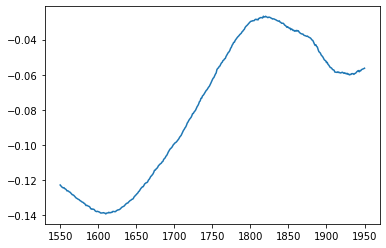

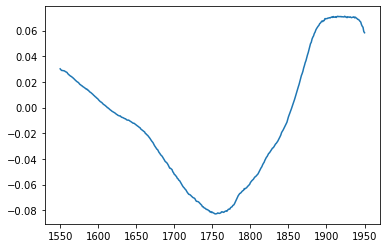

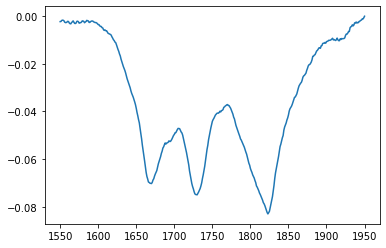

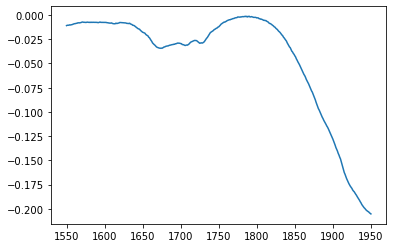

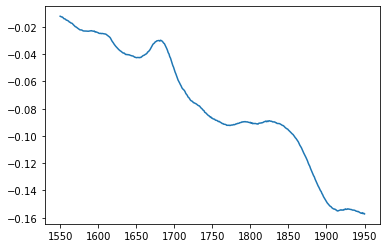

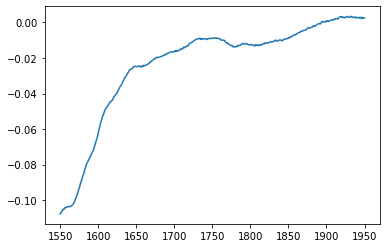

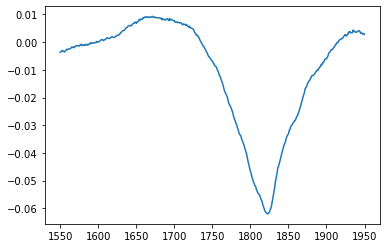

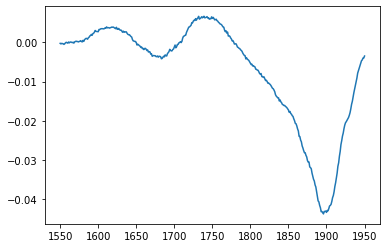

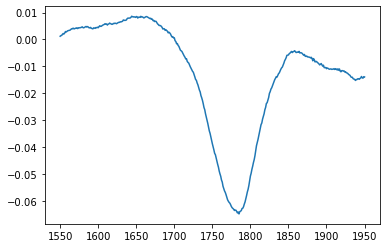

In [39]:
dr = dif.loc[dif['range'] > 0.05]
for i in range(dr.shape[0]):
    plt.plot(waves, dr.iloc[i, :-1])
    plt.show()

In [40]:
dfs[5]['depth']

0     -1.680723
1     -0.374960
2      0.982823
3      2.443119
4      3.806694
5      5.150049
6      6.359800
7      7.824109
8      9.276532
9     10.760247
10    12.022627
11    13.342870
12    14.806824
13    16.090236
14    17.482510
15    18.855229
16    20.223628
17    21.571504
18    23.018948
19    24.327151
20    25.707590
21    27.073599
22    28.427576
23    29.986981
24    31.150098
25    32.455099
26    33.468457
27    33.992816
28    34.413638
29    34.746176
Name: depth, dtype: float64

In [42]:
insert006 = dfs[5].copy()

In [44]:
insert006['dif_range'] = dif_range

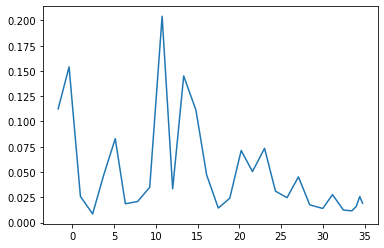

In [46]:
plt.plot(insert006['depth'], insert006['dif_range'])

In [47]:
from scipy import signal

In [48]:
one_spectrum = spectra.iloc[0, :]

In [51]:
signal.savgol_filter(one_spectrum, 5, 2)

array([0.40586432, 0.40505978, 0.40436089, 0.4037475 , 0.40337727,
       0.40299188, 0.40248434, 0.40185682, 0.40114688, 0.40048751,
       0.40000181, 0.39958674, 0.39899849, 0.39840422, 0.39783634,
       0.39706325, 0.39644597, 0.39598263, 0.39550709, 0.39473228,
       0.39392932, 0.39332719, 0.39279933, 0.39232524, 0.39186251,
       0.39136946, 0.39079848, 0.39027787, 0.38979575, 0.38937744,
       0.38889206, 0.38846225, 0.38789589, 0.38717783, 0.38656116,
       0.38626368, 0.38607419, 0.38567167, 0.38522754, 0.3845892 ,
       0.38382566, 0.38338104, 0.3831962 , 0.38305599, 0.38279583,
       0.38236626, 0.38180029, 0.38134463, 0.38119428, 0.38108943,
       0.38093869, 0.38066204, 0.38022083, 0.37986165, 0.37972663,
       0.37966916, 0.37964499, 0.37956899, 0.37949429, 0.37909063,
       0.37896457, 0.37901304, 0.37917777, 0.37928456, 0.37933483,
       0.37926524, 0.37919707, 0.37919654, 0.37933844, 0.37947046,
       0.37958693, 0.37941245, 0.37933412, 0.37951671, 0.37977

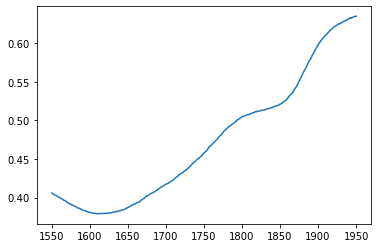

In [52]:
plt.plot(waves, one_spectrum)

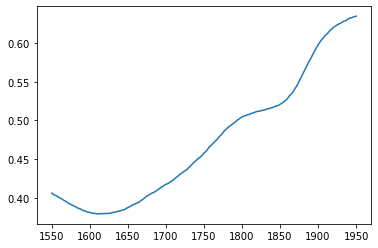

In [53]:
plt.plot(waves, signal.savgol_filter(one_spectrum, 5, 2))

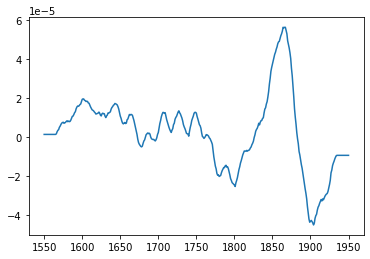

In [58]:
plt.plot(waves, signal.savgol_filter(one_spectrum, 31, 2, deriv=2))

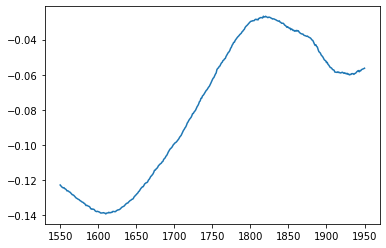

In [60]:
plt.plot(waves, dif.iloc[0, :-1])

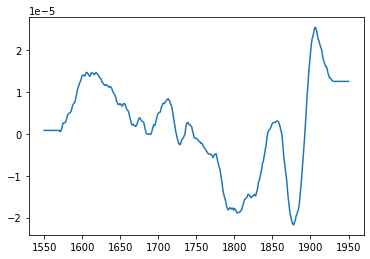

In [62]:
plt.plot(waves, signal.savgol_filter(dif.iloc[0, :-1], 41, 2, deriv=2))

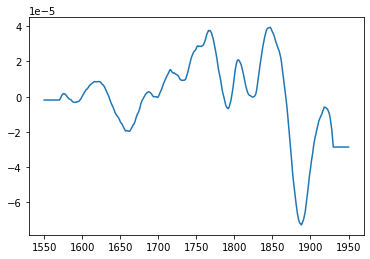

In [63]:
plt.plot(waves, signal.savgol_filter(dif.iloc[1, :-1], 41, 2, deriv=2))

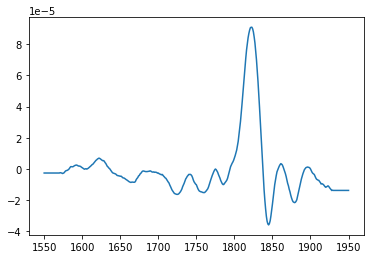

In [64]:
plt.plot(waves, signal.savgol_filter(dif.iloc[16, :-1], 41, 2, deriv=2))

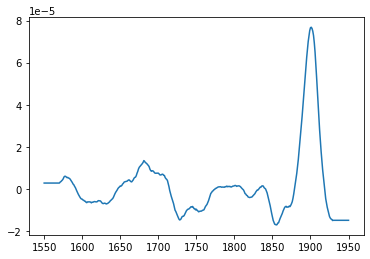

In [65]:
plt.plot(waves, signal.savgol_filter(dif.iloc[17, :-1], 41, 2, deriv=2))

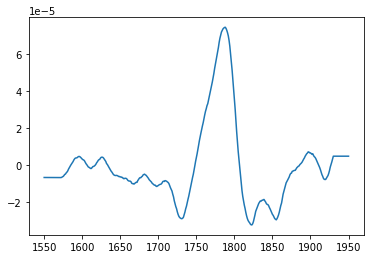

In [66]:
plt.plot(waves, signal.savgol_filter(dif.iloc[18, :-1], 41, 2, deriv=2))

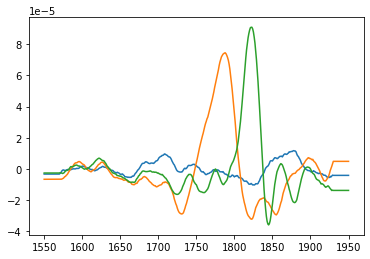

In [70]:
plt.plot(waves, signal.savgol_filter(dif.iloc[23, :-1], 41, 2, deriv=2))
plt.plot(waves, signal.savgol_filter(dif.iloc[18, :-1], 41, 2, deriv=2))
plt.plot(waves, signal.savgol_filter(dif.iloc[16, :-1], 41, 2, deriv=2))

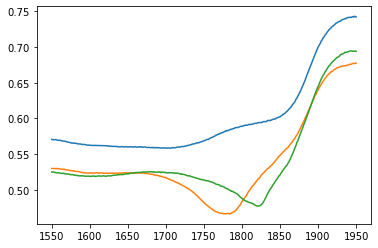

In [71]:
plt.plot(waves, spectra.iloc[23, :])
plt.plot(waves, spectra.iloc[18, :])
plt.plot(waves, spectra.iloc[16, :])

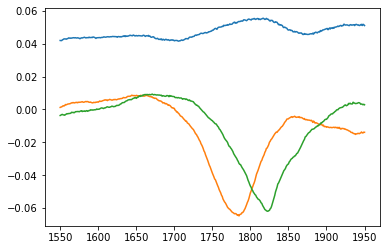

In [72]:
plt.plot(waves, dif.iloc[23, :-1])
plt.plot(waves, dif.iloc[18, :-1])
plt.plot(waves, dif.iloc[16, :-1])